In [91]:
import numpy as np
import pandas as pd
import os
import json
import glob
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm
from ipywidgets import interactive
from collections import defaultdict
import folium
import re
from collections import Counter
%matplotlib inline
inline_rc = dict(mpl.rcParams)

Modify the Code below to read in downloadable data or web scrap data

In [11]:
df_business = pd.read_csv('data/csv_files/business.csv')

Check Data

In [12]:
df_business.head()

,id,alias,name,image_url,url,review_count,categories1,categories2,categories3,rating,...,transactions1,transactions2,transactions3,address1,address2,address3,city,zip_code,api_search_zip,api_search_offset
0,FaR-Kv-0ZzgcqFW1sCnacw,citizens-of-chelsea-new-york,Citizens Of Chelsea,https://s3-media4.fl.yelpcdn.com/bphoto/-UEMxN...,https://www.yelp.com/biz/citizens-of-chelsea-n...,1028,coffee,breakfast_brunch,australian,4.0,...,delivery,pickup,NaN,401 W 25th St,NaN,NaN,New York,10001,10001,0
1,IOHaEgK1zDvUvB3SfKuGCw,parker-and-quinn-new-york,Parker & Quinn,https://s3-media4.fl.yelpcdn.com/bphoto/6xuN0y...,https://www.yelp.com/biz/parker-and-quinn-new-...,1647,newamerican,bars,breakfast_brunch,4.0,...,delivery,pickup,NaN,64 W 39th St,NaN,NaN,New York,10018,10001,0
2,OOAFPiztVlStZIUDwcixqA,miznon-new-york-7,Miznon,https://s3-media3.fl.yelpcdn.com/bphoto/VD8fCi...,https://www.yelp.com/biz/miznon-new-york-7?adj...,117,sandwiches,mediterranean,bars,4.0,...,delivery,pickup,NaN,20 Hudson Yards,NaN,NaN,New York,10001,10001,0
3,Ve6GVzzJpR5QIIPdcn6ViQ,mercato-new-york,Mercato,https://s3-media3.fl.yelpcdn.com/bphoto/LTDeQg...,https://www.yelp.com/biz/mercato-new-york?adju...,1053,italian,cocktailbars,desserts,4.0,...,delivery,pickup,NaN,352 W 39th St,NaN,NaN,New York,10018,10001,0
4,VqgqLjiOYAydLXOemivxWw,in-common-nyc-new-york,In Common NYC,https://s3-media4.fl.yelpcdn.com/bphoto/O5uIh5...,https://www.yelp.com/biz/in-common-nyc-new-yor...,124,cafes,breakfast_brunch,NaN,4.5,...,delivery,pickup,NaN,441 9th Ave,NaN,NaN,New York,10001,10001,0


In [13]:
df_business.columns.values.tolist()

['id',
 'alias',
 'name',
 'image_url',
 'url',
 'review_count',
 'categories1',
 'categories2',
 'categories3',
 'rating',
 'latitude',
 'longitude',
 'price',
 'transactions1',
 'transactions2',
 'transactions3',
 'address1',
 'address2',
 'address3',
 'city',
 'zip_code',
 'api_search_zip',
 'api_search_offset']

In [14]:
df_business.shape

(18815, 23)

In [15]:
df_business.describe()

,review_count,rating,latitude,longitude,zip_code,api_search_zip,api_search_offset
count,18815.000000,18815.000000,18815.000000,18815.000000,18815.000000,18815.000000,18815.000000
mean,203.406218,3.674887,40.725283,-73.953111,10511.137497,10563.740260,410.268403
std,413.645597,0.736048,0.073877,0.099714,1135.371625,572.250929,281.381252
min,10.000000,1.000000,40.442180,-74.364520,7001.000000,10001.000000,0.000000
25%,28.000000,3.500000,40.685010,-73.992110,10018.000000,10017.000000,150.000000
50%,74.000000,4.000000,40.729807,-73.963680,10465.000000,10306.000000,400.000000
75%,217.000000,4.000000,40.761683,-73.907036,11225.000000,11206.000000,650.000000
max,15236.000000,5.000000,40.940436,-73.657768,90010.000000,11697.000000,950.000000


In [16]:
pd.set_option('display.max_rows', None)

In [17]:
#drop columns
df_business_v2 = df_business.drop(['image_url', 'url', 'alias', 'transactions1', 'transactions2', 'transactions3', 'address1', 'address2', 'address3', 'api_search_zip', 'api_search_offset'], axis=1)

Check for Nulls

In [18]:
# Report on Nulls
null_report = pd.DataFrame({'nunique': df_business_v2.nunique(),
                            '# Non-Null': df_business_v2.notnull().sum(),
                            '# Nulls': df_business_v2.isna().sum(),
                            '% Nulls': df_business_v2.isna().sum()/len(df_business_v2)*100,
                           })
    
null_report = null_report.reset_index().rename({'index':'column'},axis=1)
null_report

,column,nunique,# Non-Null,# Nulls,% Nulls
0,id,18618,18815,0,0.000000
1,name,15887,18815,0,0.000000
2,review_count,1402,18815,0,0.000000
3,categories1,237,18815,0,0.000000
4,categories2,244,13169,5646,30.007972
5,categories3,223,7841,10974,58.325804
6,rating,9,18815,0,0.000000
7,latitude,17669,18815,0,0.000000
8,longitude,17448,18815,0,0.000000
9,price,4,14528,4287,22.785012


Results of Null Report:
Categories and price have a lot of missing values, so I will only leverage categories1 and drop the remaining. We will use them for EDA but very likely gonna exclude them for analysis.

In [19]:
# Drop rows with null for race and ethnicity
df_business_v3 = df_business_v2.dropna(subset=['latitude', 'longitude', 'zip_code'])

In [20]:
df_business_v3.groupby(['city'])['city'].count().sort_values(ascending=False)

city
New York                     7216
Brooklyn                     4200
Bronx                         930
Staten Island                 639
Flushing                      553
Astoria                       456
Jamaica                       304
Queens                        291
Long Island City              217
Jackson Heights               207
Forest Hills                  155
Jersey City                   155
Elmhurst                      154
Yonkers                       140
Ridgewood                     132
Bayside                       127
Woodside                      123
Elizabeth                     110
Bayonne                        96
Sunnyside                      92
Corona                         90
New Rochelle                   83
Valley Stream                  77
East Elmhurst                  67
Newark                         66
Fresh Meadows                  61
Rego Park                      60
Ozone Park                     60
The Bronx                      58
Woodbridg

We see cities name that would need to be clean, for example NY, BROOKLYN, New york, brooklyn, Brooklyn NY, Brooklyn, Brooklyn Ny, Brooklyn, NY, Brooklyn Heights, S RICHMOND, NEW YORK, NY, Queens County, New Yark, New York, Oueens ...etc.
Probably need to consider manually cleaning them or drop this column overall. And since we're using longitude and latitude for clustering we don't need city information for clustering, so we will drop this instead

Clean up Price Point

In [21]:
df_business_v3['price'].unique()

array(['$$', '$$$', nan, '$$$$', '$'], dtype=object)

EDA

C:\Users\samue\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


Text(0.5, 0, 'City')

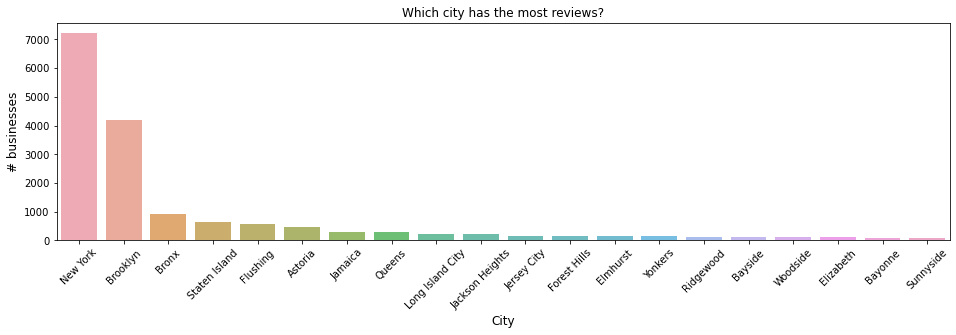

In [22]:
#how many cities and business per city
x=df_business_v3['city'].value_counts()
x=x.sort_values(ascending=False)
x=x.iloc[0:20]
plt.figure(figsize=(16,4))
ax = sns.barplot(x.index, x.values, alpha=0.8)
plt.title("Which city has the most reviews?")
locs, labels = plt.xticks()
plt.setp(labels, rotation=45)
plt.ylabel('# businesses', fontsize=12)
plt.xlabel('City', fontsize=12)

In [23]:
# # code for downloadable dataset
# business_cats = ''.join(df_business['categories'].astype('str'))

# cats=pd.DataFrame(business_cats.split(','),columns=['categories'])

# #prep for chart
# x=cats.categories.value_counts()

# x=x.sort_values(ascending=False)
# x=x.iloc[0:20]

# #chart
# plt.figure(figsize=(16,4))
# ax = sns.barplot(x.index, x.values, alpha=0.8)#,color=color[5])
# plt.title("What are the top categories?",fontsize=25)
# locs, labels = plt.xticks()
# plt.setp(labels, rotation=80)
# plt.ylabel('# businesses', fontsize=12)
# plt.xlabel('Category', fontsize=12)

# plt.show()

In [24]:
# # code for downloadable dataset
# cats.groupby(['categories'])['categories'].count().sort_values(ascending=False)

In [25]:
#get unique categories
cat1_list = df_business_v3['categories1'].tolist()
cat2_list = df_business_v3['categories2'].tolist()
cat3_list = df_business_v3['categories3'].tolist()
business_cats = cat1_list + cat2_list + cat3_list
cats = pd.DataFrame(business_cats, columns=['categories'])
cats.head()

,categories
0,coffee
1,newamerican
2,sandwiches
3,italian
4,cafes


C:\Users\samue\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


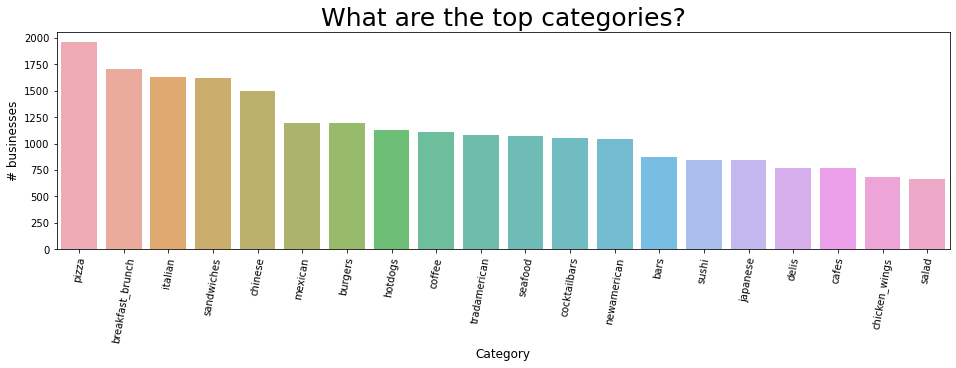

In [26]:
#prep for chart
x=cats.categories.value_counts()

x=x.sort_values(ascending=False)
x=x.iloc[0:20]

#chart
plt.figure(figsize=(16,4))
ax = sns.barplot(x.index, x.values, alpha=0.8)#,color=color[5])
plt.title("What are the top categories?",fontsize=25)
locs, labels = plt.xticks()
plt.setp(labels, rotation=80)
plt.ylabel('# businesses', fontsize=12)
plt.xlabel('Category', fontsize=12)

plt.show()

In [27]:
cats.groupby(['categories'])['categories'].count().sort_values(ascending=False)

categories
pizza                   1960
breakfast_brunch        1710
italian                 1627
sandwiches              1624
chinese                 1493
mexican                 1196
burgers                 1194
hotdogs                 1127
coffee                  1105
tradamerican            1083
seafood                 1070
cocktailbars            1050
newamerican             1039
bars                     871
sushi                    847
japanese                 840
delis                    773
cafes                    766
chicken_wings            687
salad                    669
bakeries                 522
mediterranean            495
caribbean                472
wine_bars                463
latin                    459
thai                     429
korean                   420
indpak                   398
juicebars                385
noodles                  384
desserts                 377
asianfusion              372
halal                    344
diners                   333
bag

In [28]:
# do we see any franchise store?
df_business_v3['name'].str.contains('(?i)mcdonald|wendy|burger king|subway|taco bell|kfc|pizza hut|starbucks|five guys|domino').sum()

617

In [29]:
df_business_v3[df_business_v3['name'].str.contains('(?i)mcdonald|wendy|burger king|subway|taco bell|kfc|pizza hut|starbucks|five guys|domino')]

,id,name,review_count,categories1,categories2,categories3,rating,latitude,longitude,price,city,zip_code
545,_MwxN8ai-KUfLIG7_cPCUg,Taco Bell Cantina,45,mexican,hotdogs,NaN,3.5,40.752989,-73.992481,NaN,New York,10018
590,w5bAG1wBfEi2gQ2aKoXjtQ,Five Guys,153,burgers,hotdogs,hotdog,3.0,40.752530,-73.994732,$$,New York,10001
729,cF-dEjuELf-m4CWN9zFhjw,Taco Bell Cantina,22,mexican,hotdogs,NaN,3.5,40.750926,-73.986737,NaN,New York,10018
739,b5L2jf66fOspImzGXzW_Lg,KFC,14,hotdogs,chickenshop,chicken_wings,3.0,40.749810,-73.994784,NaN,New York,10001
760,aUGq0Cy4yNkBlwzDP2OTbQ,McDonald's,85,hotdogs,burgers,coffee,2.0,40.752510,-73.993004,$,New York,10001
824,u6IRyQ8qKSnBTMzbdsqpzw,Five Guys,172,burgers,hotdogs,hotdog,3.5,40.757189,-73.989197,$$,New York,10036
1380,DG3Ze4-Rj7JieKBEryV0EA,Burger King,36,hotdogs,burgers,NaN,2.0,40.718345,-73.986582,$,New York,10002
1417,0l-l2j5NAIqtychRNs17Dw,McDonald's,128,hotdogs,burgers,coffee,2.0,40.718940,-73.988290,$,New York,10002
1524,Ac-eO27Uay-lw7mYjxq3rQ,Subway,11,sandwiches,hotdogs,NaN,2.5,40.714109,-73.986986,$,New York,10002
1539,xuZXAeIe7AbhiuKDnwBknw,Subway,31,sandwiches,hotdogs,NaN,2.5,40.717210,-73.990000,$,New York,10002


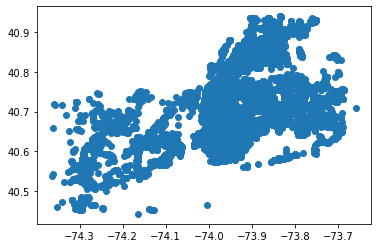

In [30]:
# visualizing the longitude and latitude
plt.scatter(x=df_business_v3['longitude'], y=df_business_v3['latitude'])
plt.show()

In [31]:
m = folium.Map(location=[df_business_v3.latitude.mean(), df_business_v3.longitude.mean()], zoom_start=9, 
               tiles='OpenStreet Map')
for _, row in df_business_v3.iterrows():
    folium.CircleMarker(
        location=[row.latitude, row.longitude],
        radius=5,
        color='#1787FE',
        fill=True,
        fill_colour='#1787FE'
    ).add_to(m)

m

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



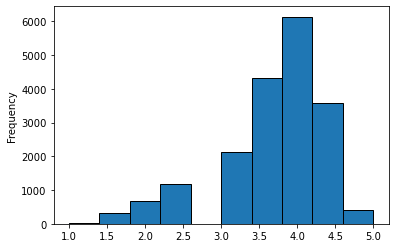

In [32]:
# Characterize the rating data by using histogram
df_business_v3['rating'].plot(kind='hist', edgecolor='black')
print(df_business_v3)

In [33]:
Restaurant_total_number=df_business_v3["name"].count()
restaurant_pricing_under_10= df_business_v3.loc[df_business_v3["price"]=="$"]
restaurant_count_pricing_under_10 = restaurant_pricing_under_10["name"].count()
percent_restaurant_pricing_under_10= (restaurant_count_pricing_under_10/Restaurant_total_number) * 100

In [34]:
restaurant_pricing_bw_11_30= df_business_v3.loc[df_business_v3["price"]=="$$"]
restaurant_count_pricing_bw_11_30 = restaurant_pricing_bw_11_30["name"].count()
percent_restaurant_pricing_bw_11_30= (restaurant_count_pricing_bw_11_30/Restaurant_total_number) * 100

In [35]:
restaurant_pricing_bw_31_60= df_business_v3.loc[df_business_v3["price"]=="$$$"]
restaurant_count_pricing_bw_31_60 = restaurant_pricing_bw_31_60["name"].count()
percent_restaurant_pricing_bw_31_60= (restaurant_count_pricing_bw_31_60/Restaurant_total_number) * 100

In [36]:
restaurant_pricing_above_60= df_business_v3.loc[df_business_v3["price"]=="$$$$"]
restaurant_count_pricing_above_60 = restaurant_pricing_above_60["name"].count()
percent_restaurant_pricing_bw__above_60= (restaurant_count_pricing_above_60/Restaurant_total_number) * 100

In [37]:
Restaurants_Pricing_table = pd.DataFrame({
    "Total Restaurant Pricing Under $10":f"{restaurant_count_pricing_under_10:,}",
    "Total Restaurant Pricing $11-30": f"{restaurant_count_pricing_bw_11_30:,}",
    "Total Restaurant Pricing $31-60": f"{restaurant_count_pricing_bw_31_60:,}",
    "Total Restaurant Pricing Above $60": f"{restaurant_count_pricing_above_60:,}",
    "% Pricing Under $10": f"{percent_restaurant_pricing_under_10:.2f}%",
    "% Pricing between $11-30": f"{percent_restaurant_pricing_bw_11_30:.2f}%",
    "% Pricing between $31-60": f"{percent_restaurant_pricing_bw_31_60:.2f}%",
    "% Pricing above $60": f"{percent_restaurant_pricing_bw__above_60:.2f}%",
}, index=[0])

Restaurants_Pricing_table

,Total Restaurant Pricing Under $10,Total Restaurant Pricing $11-30,Total Restaurant Pricing $31-60,Total Restaurant Pricing Above $60,% Pricing Under $10,% Pricing between $11-30,% Pricing between $31-60,% Pricing above $60
0,"5,194","7,956","1,087",291,27.61%,42.29%,5.78%,1.55%


In [38]:
# Value counts for price ranges and create a dataFrame
count_pricing =df_business_v3['price'].value_counts().rename_axis('Restaurant Price Range').reset_index(name='Restaurant Counts')
pricing_df=count_pricing.set_index('Restaurant Price Range')
pricing_df.rename(index={'$':'Under $10','$$':'Between $11-30','$$$':'Between $31-60','$$$$':'Above $60'},inplace=True)
pricing_df

,Restaurant Counts
Restaurant Price Range,
Between $11-30,7956
Under $10,5194
Between $31-60,1087
Above $60,291


Correlation between Review count and Rating

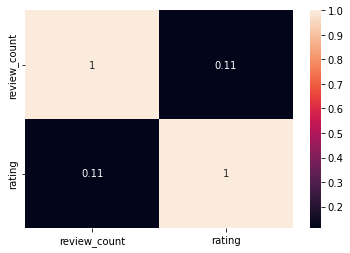

In [39]:
ax = sns.heatmap(df_business_v3[['review_count', 'rating']].corr(), annot=True)